## Dataset
Dataset của đồ án được tổng hợp từ nhiều bộ dữ liệu và ảnh trên internet.
Link: https://drive.google.com/drive/folders/1pOUkQjFDEiXP9UsLkmxXc4oDJ1CO1pql?usp=sharing

## Import Library

In [ ]:
import os
import cv2
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import keras
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')
import random
from PIL import Image

In [ ]:
from keras import Model
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input as vgg16_preprocess_input
from keras.applications.resnet50 import ResNet50
from keras.applications.resnet50 import preprocess_input as resnet50_preprocess_input
from keras.callbacks import ModelCheckpoint, TensorBoard
from keras.layers import GlobalAveragePooling2D, Dense, Dropout
from keras.preprocessing import image
from keras.models import load_model
from keras.utils import to_categorical
#from keras.utils import np_utils
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.layers import Conv2D, Flatten, Dense

## Tăng cường dữ liệu

In [ ]:
import os
import cv2
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def augment_and_save_images(input_folder, output_folder, num_augmented_images=3):
    # Tạo thư mục đầu ra nếu nó chưa tồn tại
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Tạo đối tượng ImageDataGenerator để áp dụng tăng cường dữ liệu
    data_generator = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.2,
        height_shift_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
    )

    # Lấy danh sách tất cả các hình ảnh trong thư mục đầu vào
    all_images = [filename for filename in os.listdir(input_folder) if filename.endswith(('.jpg', '.jpeg', '.png'))]

    # Chọn ngẫu nhiên num_augmented_images hình ảnh từ tất cả các hình ảnh
    selected_images = np.random.choice(all_images, size=num_augmented_images, replace=False)

    # Lặp qua từng hình ảnh được chọn và lưu vào thư mục đầu ra
    for idx, filename in enumerate(selected_images):
        # Đọc hình ảnh từ file
        img = cv2.imread(os.path.join(input_folder, filename))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Chuyển đổi sang định dạng màu RGB

        # Thêm một chiều để phù hợp với đầu vào của ImageDataGenerator
        img = np.expand_dims(img, axis=0)

        # Tạo generator cho hình ảnh
        image_generator = data_generator.flow(img, batch_size=1)

        augmented_image = image_generator.next()[0]

        # Chuyển định dạng của hình ảnh trở lại BGR để lưu vào file
        augmented_image = cv2.cvtColor(augmented_image.astype(np.uint8), cv2.COLOR_RGB2BGR)

        # Lưu hình ảnh vào file với định dạng "augment_images.số"
        output_filename = f"augment_images.{idx}.png"
        output_path = os.path.join(output_folder, output_filename)
        cv2.imwrite(output_path, augmented_image)

# Sử dụng hàm để tăng cường dữ liệu và lưu vào thư mục đầu ra
input_folder_path = '/content/drive/MyDrive/Fire_Classification/all_fire_dataset/fire_images'
output_folder_path = '/content/drive/MyDrive/Fire_Classification/all_fire_dataset/augmented_fire_images'
augment_and_save_images(input_folder_path, output_folder_path, num_augmented_images=1000)

In [ ]:
input_folder_path = '/content/drive/MyDrive/Fire_Classification/all_fire_dataset/non_fire_images'
output_folder_path = '/content/drive/MyDrive/Fire_Classification/all_fire_dataset/augmented_non_fire_images'
augment_and_save_images(input_folder_path, output_folder_path, num_augmented_images=1000)

In [ ]:
import os
import shutil

def move_images(src_folder, dest_folder):
    # Tạo thư mục đích nếu nó chưa tồn tại
    if not os.path.exists(dest_folder):
        os.makedirs(dest_folder)

    # Lặp qua từng file trong thư mục nguồn và di chuyển sang thư mục đích
    for filename in os.listdir(src_folder):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            src_path = os.path.join(src_folder, filename)
            dest_path = os.path.join(dest_folder, filename)
            shutil.move(src_path, dest_path)


In [ ]:
# Đường dẫn của thư mục nguồn (augmented_fire_images)
src_folder_path = '/content/drive/MyDrive/Fire_Classification/all_fire_dataset/augmented_fire_images'

# Đường dẫn của thư mục đích (fire_images)
dest_folder_path = '/content/drive/MyDrive/Fire_Classification/all_fire_dataset/fire_images'

# Di chuyển tất cả các ảnh từ thư mục nguồn sang thư mục đích
move_images(src_folder_path, dest_folder_path)

In [ ]:
# Đường dẫn của thư mục nguồn (augmented_fire_images)
src_folder_path = '/content/drive/MyDrive/Fire_Classification/all_fire_dataset/augmented_non_fire_images'

# Đường dẫn của thư mục đích (fire_images)
dest_folder_path = '/content/drive/MyDrive/Fire_Classification/all_fire_dataset/non_fire_images'

# Di chuyển tất cả các ảnh từ thư mục nguồn sang thư mục đích
move_images(src_folder_path, dest_folder_path)

## Visualize data

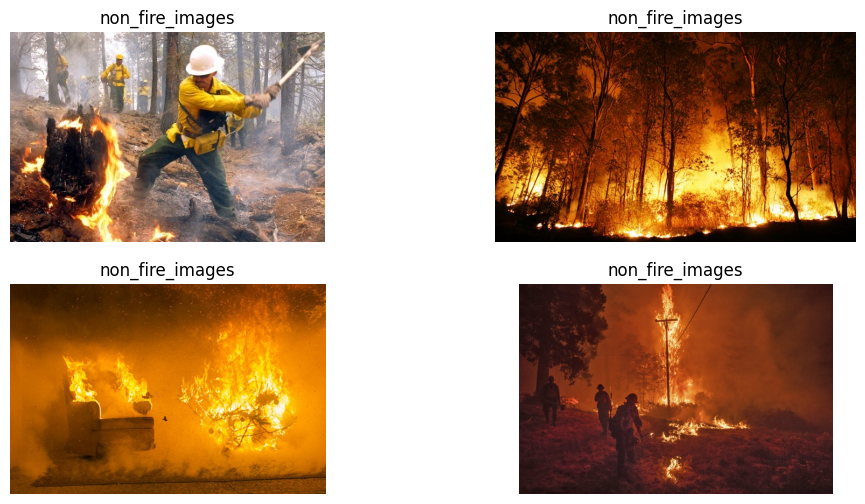

In [ ]:
def show_random_images(directory_path, num_images=4):
    # Lấy danh sách tất cả các tệp hình ảnh trong thư mục
    image_files = [f for f in os.listdir(directory_path) if f.endswith(('.jpg', '.jpeg', '.png', '.gif'))]

    # Chọn ngẫu nhiên num_images tệp
    selected_images = random.sample(image_files, min(num_images, len(image_files)))

    # Hiển thị ảnh
    fig, axes = plt.subplots(2, 2, figsize=(12, 6))

    for i, image_name in enumerate(selected_images):
        image_path = os.path.join(directory_path, image_name)
        img = Image.open(image_path)
        ax = axes[i // 2, i % 2]
        ax.imshow(img)
        ax.set_title('non_fire_images')
        ax.axis('off')

    plt.show()

# Sử dụng hàm để hiển thị 8 ảnh ngẫu nhiên từ một thư mục cụ thể
show_random_images("/content/drive/MyDrive/Fire_Classification/all_fire_dataset/fire_images")

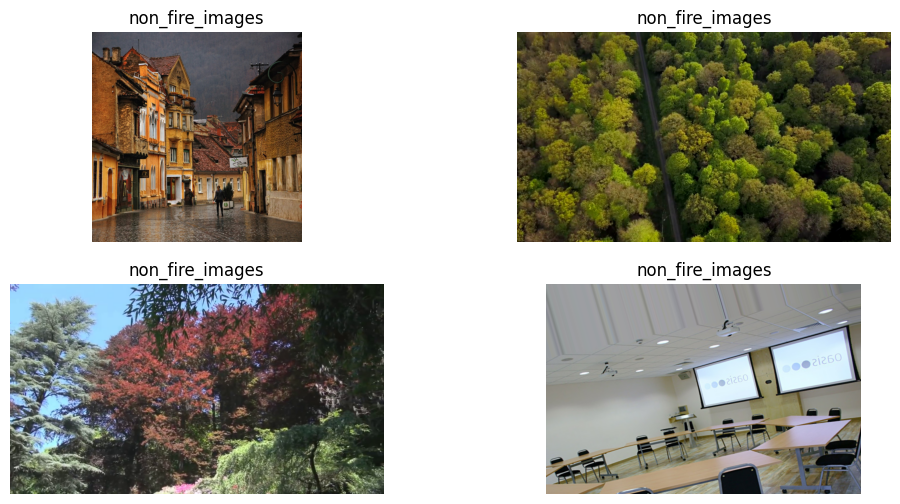

In [ ]:
show_random_images("/content/drive/MyDrive/Fire_Classification/all_fire_dataset/non_fire_images")

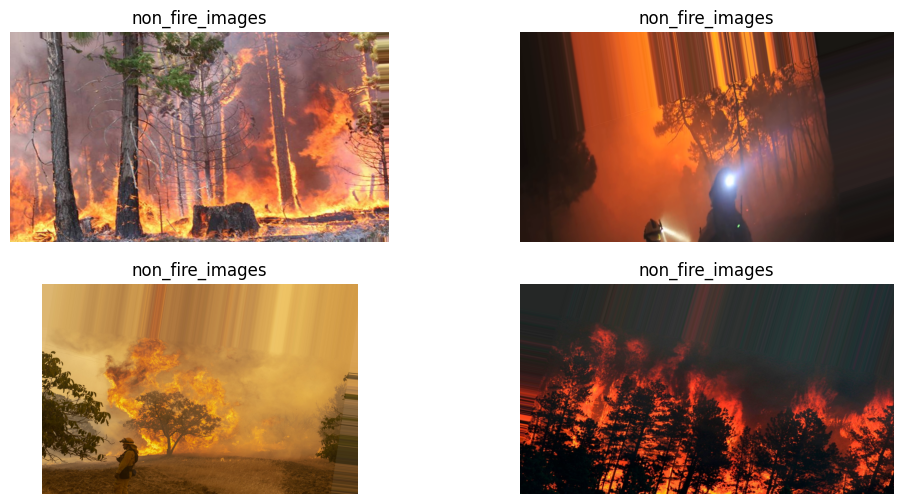

In [ ]:
show_random_images("/content/drive/MyDrive/Fire_Classification/all_fire_dataset/augmented_fire_images")

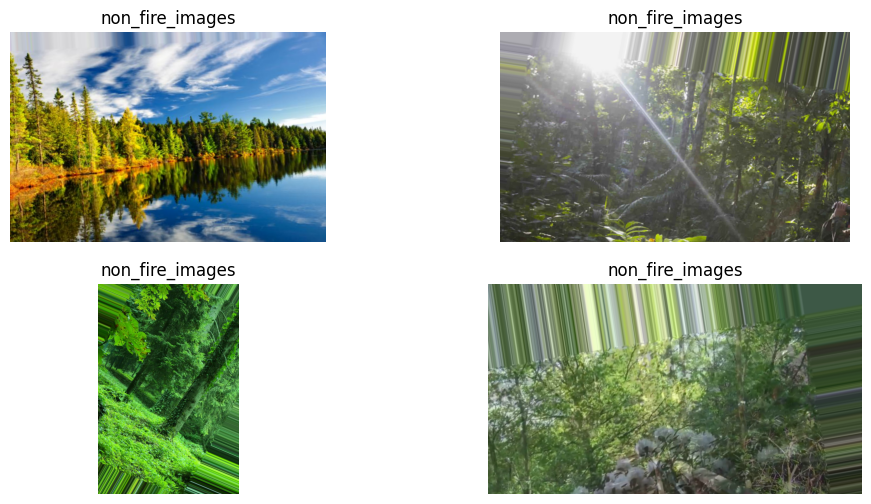

In [ ]:
show_random_images("/content/drive/MyDrive/Fire_Classification/all_fire_dataset/augmented_non_fire_images")

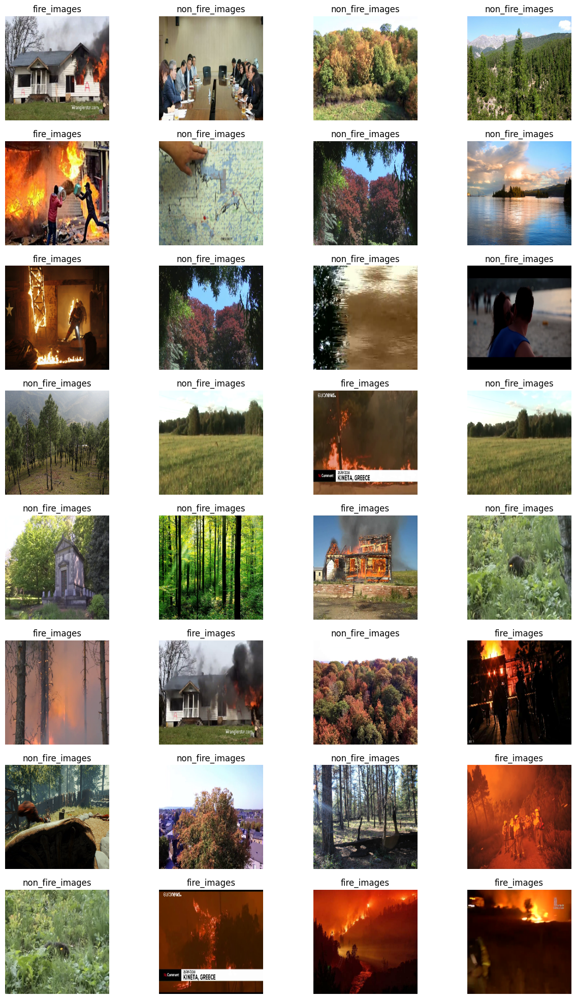

In [ ]:
class_names = train.class_names
class_names
plt.figure(figsize=(15, 25))
for images, labels in train.take(1):
    for i in range(32):
        ax = plt.subplot(8, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

## Train test split

In [ ]:
def count_images(folder_path):
    # Kiểm tra xem thư mục có tồn tại hay không
    if not os.path.exists(folder_path):
        print(f"Thư mục '{folder_path}' không tồn tại.")
        return

    # Đếm số lượng ảnh trong thư mục
    image_count = len([filename for filename in os.listdir(folder_path) if filename.endswith(('.jpg', '.jpeg', '.png'))])

    print(f"Số lượng ảnh trong thư mục '{folder_path}': {image_count}")

In [ ]:
# Đường dẫn của thư mục fire_images
fire_images_folder_path = '/content/drive/MyDrive/Fire_Classification/all_fire_dataset/fire_images'

# Kiểm tra số lượng ảnh trong thư mục fire_images
count_images(fire_images_folder_path)

Số lượng ảnh trong thư mục '/content/drive/MyDrive/Fire_Classification/all_fire_dataset/fire_images': 3581


In [ ]:
# Đường dẫn của thư mục fire_images
fire_images_folder_path = '/content/drive/MyDrive/Fire_Classification/all_fire_dataset/non_fire_images'

# Kiểm tra số lượng ảnh trong thư mục fire_images
count_images(fire_images_folder_path)

Số lượng ảnh trong thư mục '/content/drive/MyDrive/Fire_Classification/all_fire_dataset/non_fire_images': 3390


In [ ]:
#Files
path='/content/drive/MyDrive/Fire_Classification/all_fire_dataset'
pd.DataFrame(os.listdir(path),columns=['Files'])

,Files
0,fire_images
1,non_fire_images


In [ ]:
train_data_dir =path
batch_size = 32
target_size = (224, 224)
validation_split = 0.2
train = tf.keras.preprocessing.image_dataset_from_directory(
    train_data_dir,
    validation_split=validation_split,
    subset="training",
    seed=200,
    image_size=target_size,
    batch_size=batch_size,
)
validation = tf.keras.preprocessing.image_dataset_from_directory(
    train_data_dir,
    validation_split=validation_split,
    subset="validation",
    seed=44,
    image_size=target_size,
    batch_size=batch_size,
)

Found 6967 files belonging to 2 classes.
Using 5574 files for training.
Found 6967 files belonging to 2 classes.
Using 1393 files for validation.


In [ ]:
# Lấy danh sách tên các lớp từ đối tượng
train_class_names = train.class_names
val_class_names = validation.class_names

# Lấy chỉ số của các lớp
train_class_indices = {class_name: index for index, class_name in enumerate(train_class_names)}
val_class_indices = {class_name: index for index, class_name in enumerate(val_class_names)}


# Đếm số lượng mẫu thuộc mỗi lớp trong tập huấn luyện
train_class_counts = {class_name: 0 for class_name in train_class_names}
for images, labels in train:
    for label in labels.numpy():
        class_name = train_class_names[label]
        train_class_counts[class_name] += 1

val_class_counts = {class_name: 0 for class_name in val_class_names}
for images, labels in validation:
    for label in labels.numpy():
        class_name = val_class_names[label]
        val_class_counts[class_name] += 1

# In kết quả
print("Số lượng mẫu theo lớp trong tập huấn luyện:")
print(train_class_counts)

print("Số lượng mẫu theo lớp trong tập đánh giá:")
print(val_class_counts)


Số lượng mẫu theo lớp trong tập huấn luyện:
{'fire_images': 2866, 'non_fire_images': 2708}
Số lượng mẫu theo lớp trong tập đánh giá:
{'fire_images': 725, 'non_fire_images': 668}


## VGG16

In [ ]:
base_model = tf.keras.applications.VGG16(input_shape=(224,224,3),include_top=False,weights='imagenet')
base_model.trainable = False
model=keras.models.Sequential()
model.add(base_model)
model.add(keras.layers.Flatten())
model.add(keras.layers.Dropout(.2))
model.add(keras.layers.Dense(1,activation=tf.nn.sigmoid))
model.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dropout (Dropout)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 1)                 25089     
                                                                 
Total params: 14739777 (56.23 MB)
Trainable params: 25089 (98.00 KB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


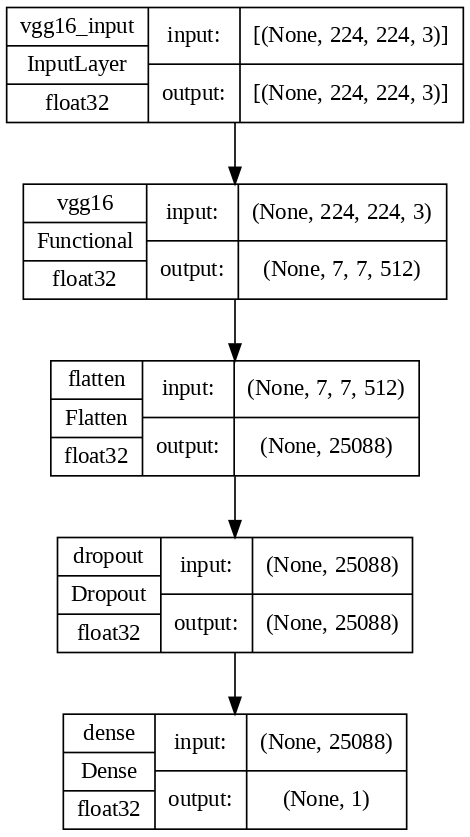

In [ ]:
tf.keras.utils.plot_model(model, to_file='VGG16.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [ ]:
checkpoint_cb =ModelCheckpoint("aug_VGG16.h5", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=3, restore_best_weights=True)
model.compile(optimizer ='adam',loss='binary_crossentropy', metrics=['accuracy'])
hist=model.fit_generator(train,epochs=20,validation_data=validation,callbacks=[checkpoint_cb,early_stopping_cb])

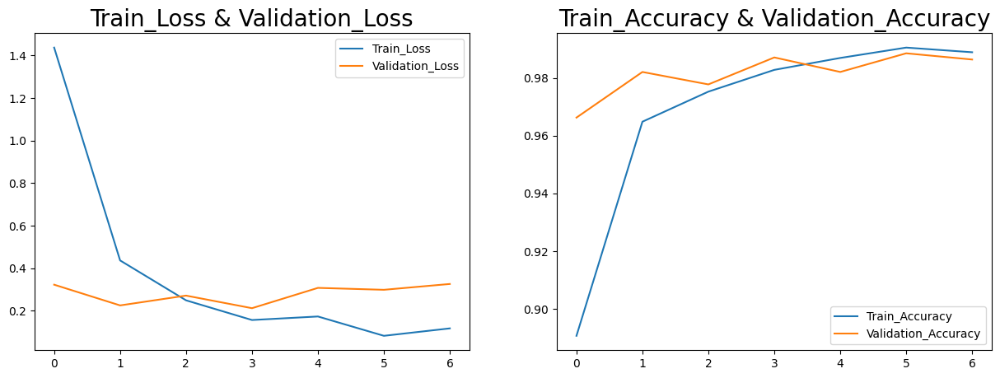

In [ ]:
hist_=pd.DataFrame(hist.history)
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()

In [ ]:
score, acc = model.evaluate(validation)
print('Test Loss =', score)
print('Test Accuracy =', acc)

44/44 [==============================] - 35s 674ms/step - loss: 0.2119 - accuracy: 0.9871
Test Loss = 0.21190468966960907
Test Accuracy = 0.9870782494544983


In [ ]:
X_val,y_val=[],[]
for images, labels in validation:
    y_val.extend(labels.numpy())
    X_val.extend(images.numpy())
predictions=model.predict(np.array(X_val))
y_pred=np.where(predictions>=.5,1,0)
df=pd.DataFrame()
df['Actual'],df['Prediction']=y_val,y_pred

44/44 [==============================] - 6s 127ms/step


Classification Report 
               precision    recall  f1-score   support

           0       0.99      0.98      0.99       725
           1       0.98      0.99      0.99       668

    accuracy                           0.99      1393
   macro avg       0.99      0.99      0.99      1393
weighted avg       0.99      0.99      0.99      1393



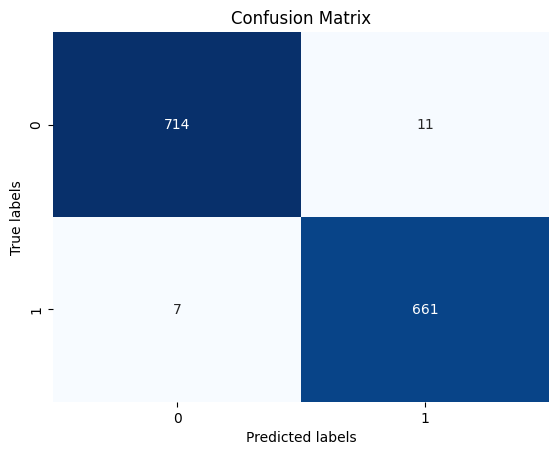

In [ ]:
ClassificationReport = classification_report(y_val,y_pred)
print('Classification Report \n', ClassificationReport )

ax= plt.subplot()
CM = confusion_matrix(y_val,y_pred)
sns.heatmap(CM, annot=True, fmt='d', ax=ax,cbar=False,cmap=plt.cm.Blues)
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
plt.show()

model.save('/content/drive/MyDrive/Fire_Classification/aug_VGG16.h5')

1/1 [==============================] - 0s 17ms/step


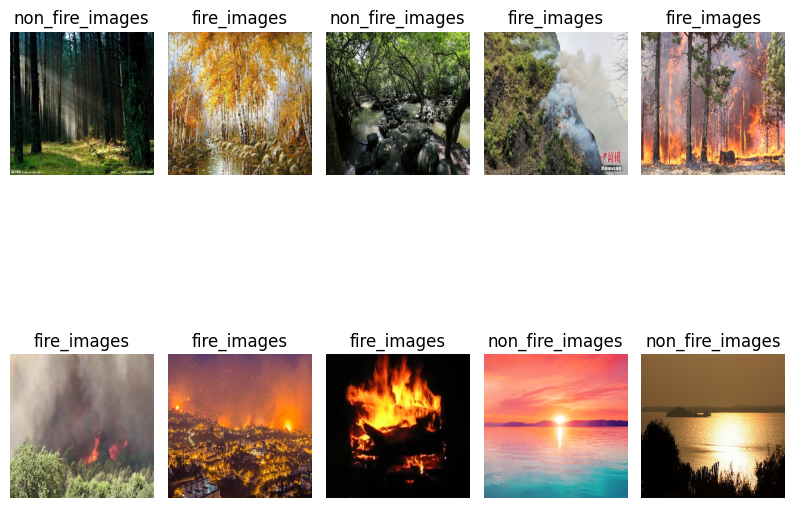

In [ ]:
def Test(model_path, test_path):
    save_model = keras.models.load_model(model_path)
    images = []
    pred = []
    class_names = ['fire_images', 'non_fire_images']

    for img in os.listdir(test_path):
        image = cv2.imread(os.path.join(test_path, img))
        image = cv2.resize(image, (224, 224))
        image =cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        images.append(image)
        image = np.expand_dims(image, axis=0)
        predict = save_model.predict(image)
        pred.append(np.where(predict >= 0.5, 1, 0))

    plt.figure(figsize=(10, 8))
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    for i in range(10):
        plt.subplot(2, 5, i + 1)
        plt.imshow(images[i].astype("uint8"))
        plt.title(f'{class_names[pred[i][0][0]]}')
        plt.axis("off")
    plt.show()

model_path = '/content/drive/MyDrive/Fire_Classification/aug_VGG16.h5'
test_path = '/content/drive/MyDrive/Fire_Classification/test_images'
Test(model_path, test_path)

## Resnet50

In [ ]:
# Create the base model from the pre-trained model ResNet50
IMG_SHAPE = (224, 224, 3)
base_model = tf.keras.applications.resnet50.ResNet50(input_shape = IMG_SHAPE,
                                         include_top = False,
                                         weights = 'imagenet')
#base_model.trainable = False
base_model.summary()


94765736/94765736 [==============================] - 5s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                      

In [ ]:
base_model.trainable = False
model=keras.models.Sequential()
model.add(base_model)
tf.keras.layers.GlobalAveragePooling2D()
#model.add(Conv2D(32, (3, 3), input_shape=(224, 224, 3), activation='relu'))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dropout(.2))
model.add(keras.layers.Dense(1,activation=tf.nn.sigmoid))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 flatten_1 (Flatten)         (None, 100352)            0         
                                                                 
 dropout_1 (Dropout)         (None, 100352)            0         
                                                                 
 dense_1 (Dense)             (None, 1)                 100353    
                                                                 
Total params: 23688065 (90.36 MB)
Trainable params: 100353 (392.00 KB)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


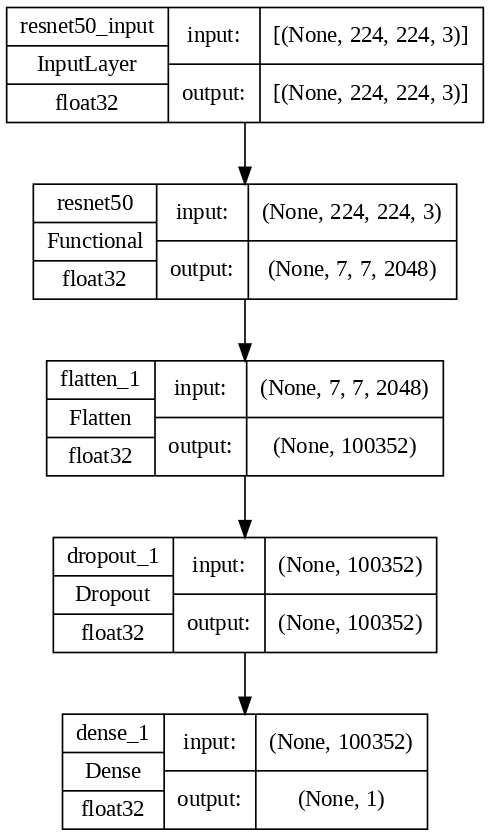

In [ ]:
tf.keras.utils.plot_model(model, to_file='Resnet50.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [ ]:
checkpoint_cb =ModelCheckpoint("aug_ResNet50.h5", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=3, restore_best_weights=True)
model.compile(optimizer ='adam',loss='binary_crossentropy', metrics=['accuracy'])
hist=model.fit_generator(train,epochs=20,validation_data=validation,callbacks=[checkpoint_cb,early_stopping_cb])

Epoch 1/20
175/175 [==============================] - 136s 713ms/step - loss: 0.5942 - accuracy: 0.9325 - val_loss: 0.3355 - val_accuracy: 0.9706
Epoch 2/20
175/175 [==============================] - 129s 704ms/step - loss: 0.1871 - accuracy: 0.9801 - val_loss: 0.1283 - val_accuracy: 0.9842
Epoch 3/20
175/175 [==============================] - 127s 695ms/step - loss: 0.1054 - accuracy: 0.9901 - val_loss: 0.1531 - val_accuracy: 0.9907
Epoch 4/20
175/175 [==============================] - 128s 708ms/step - loss: 0.0527 - accuracy: 0.9939 - val_loss: 0.1073 - val_accuracy: 0.9921
Epoch 5/20
175/175 [==============================] - 128s 704ms/step - loss: 0.0572 - accuracy: 0.9926 - val_loss: 0.1270 - val_accuracy: 0.9899
Epoch 6/20
175/175 [==============================] - 127s 695ms/step - loss: 0.0479 - accuracy: 0.9935 - val_loss: 0.2174 - val_accuracy: 0.9921
Epoch 7/20
175/175 [==============================] - 126s 687ms/step - loss: 0.0341 - accuracy: 0.9953 - val_loss: 0.1445 -

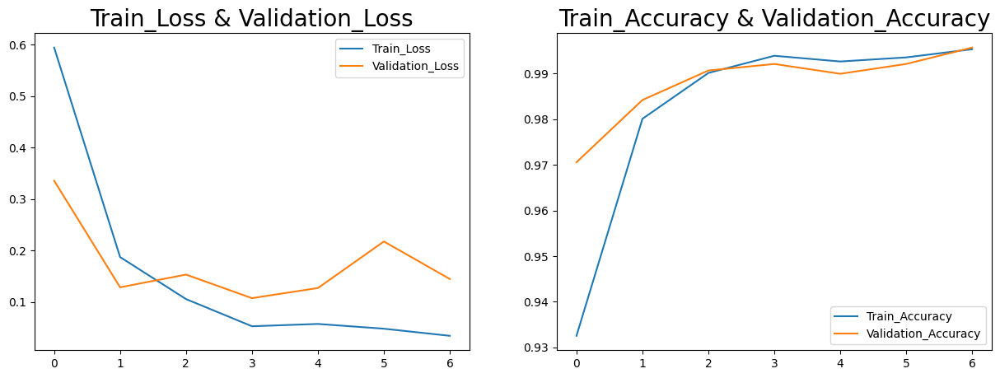

In [ ]:
hist_=pd.DataFrame(hist.history)
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()

In [ ]:
score, acc = model.evaluate(validation)
print('Test Loss =', score)
print('Test Accuracy =', acc)

44/44 [==============================] - 20s 378ms/step - loss: 0.1073 - accuracy: 0.9921
Test Loss = 0.107271708548069
Test Accuracy = 0.9921033978462219


In [ ]:
X_val,y_val=[],[]
for images, labels in validation:
    y_val.extend(labels.numpy())
    X_val.extend(images.numpy())
predictions=model.predict(np.array(X_val))
y_pred=np.where(predictions>=.5,1,0)
df=pd.DataFrame()
df['Actual'],df['Prediction']=y_val,y_pred

44/44 [==============================] - 5s 93ms/step


Classification Report 
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       725
           1       0.99      0.99      0.99       668

    accuracy                           0.99      1393
   macro avg       0.99      0.99      0.99      1393
weighted avg       0.99      0.99      0.99      1393



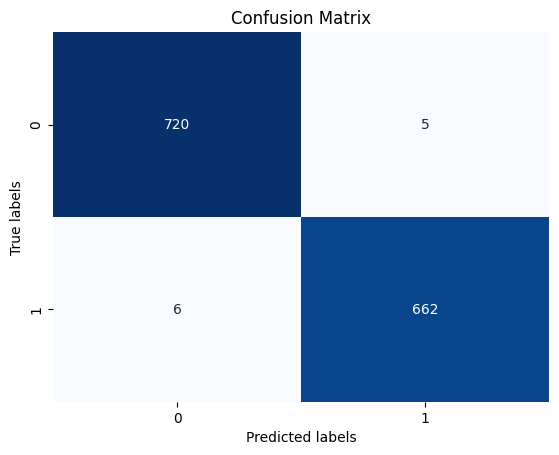

In [ ]:
ClassificationReport = classification_report(y_val,y_pred)
print('Classification Report \n', ClassificationReport )

ax= plt.subplot()
CM = confusion_matrix(y_val,y_pred)
sns.heatmap(CM, annot=True, fmt='d', ax=ax,cbar=False,cmap=plt.cm.Blues)
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
plt.show()

model.save('/content/drive/MyDrive/Fire_Classification/aug_ResNet50.h5')

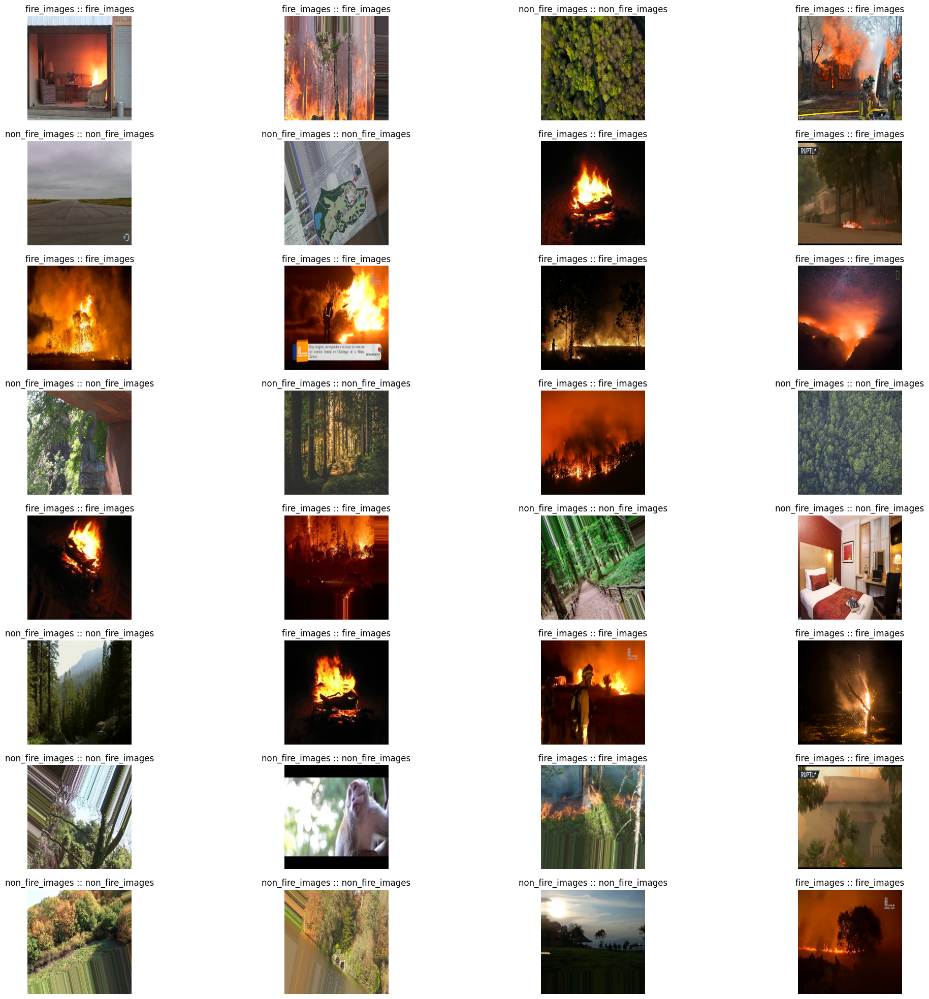

In [ ]:
plt.figure(figsize=(25,25))
for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(X_val[i].astype("uint8"))
    plt.title(f'{class_names[y_val[i]]} :: {class_names[y_pred[i][0]]}')
    plt.axis("off")

1/1 [==============================] - 0s 22ms/step


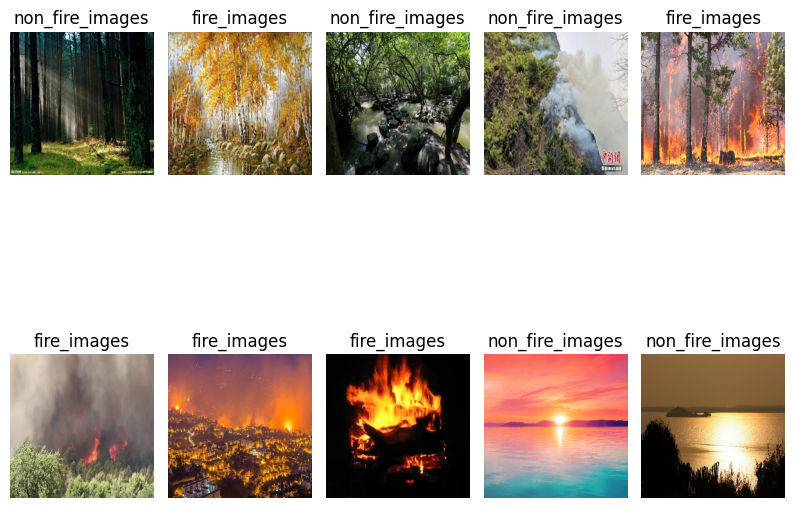

In [ ]:
model_path = '/content/drive/MyDrive/Fire_Classification/aug_ResNet50.h5'
test_path = '/content/drive/MyDrive/Fire_Classification/test_images'
Test(model_path, test_path)